# EDA Germany 

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import date, time, datetime

In [2]:
#Create dataframe from CSV
df = pd.read_csv("../data/fromAPI/cleaned_hourly_all2.csv")

In [3]:
df["train"].isna().sum()

0

In [4]:
date_format = "%Y-%m-%d %H:%M:%S"
df["arrival_plan"] = pd.to_datetime(df["arrival_plan"], format=date_format)
df["departure_plan"] = pd.to_datetime(df["departure_plan"], format=date_format)
df["arrival_change"] = pd.to_datetime(df["arrival_change"], format=date_format)
df["departure_change"] = pd.to_datetime(df["departure_change"], format=date_format)

df["arrival_plan_time"] = df["arrival_plan"].dt.time
df["arrival_plan_date"] = df["arrival_plan"].dt.date

df["departure_plan_time"] = df["departure_plan"].dt.time
df["departure_plan_date"] = df["departure_plan"].dt.date

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 904013 entries, 0 to 904012
Data columns (total 24 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   ID                     904013 non-null  object        
 1   train                  904013 non-null  object        
 2   path                   811851 non-null  object        
 3   eva_nr                 904013 non-null  int64         
 4   category               904013 non-null  int64         
 5   name                   904013 non-null  object        
 6   state                  904013 non-null  object        
 7   city                   904013 non-null  object        
 8   zip                    904013 non-null  int64         
 9   long                   904013 non-null  float64       
 10  lat                    904013 non-null  float64       
 11  arrival_plan           811851 non-null  datetime64[ns]
 12  departure_plan         904013 non-null  date

In [6]:
df.describe()

,eva_nr,category,zip,long,lat,arrival_plan,departure_plan,arrival_change,departure_change,arrival_delay_m,departure_delay_m
count,9.040130e+05,904013.00000,904013.000000,904013.000000,904013.000000,811851,904013,714997,780420,904013.000000,904013.000000
mean,8.018130e+06,3.87156,46451.163718,10.166752,50.869937,2024-07-04 21:53:05.946706944,2024-07-04 21:54:40.879921408,2024-07-04 21:31:46.184165888,2024-07-04 21:28:38.239563776,1.505565,1.573940
min,8.000001e+06,1.00000,1067.000000,6.070715,47.411032,2024-07-03 10:38:00,2024-07-03 11:00:00,2024-07-03 10:44:00,2024-07-03 11:00:00,0.000000,0.000000
25%,8.001582e+06,3.00000,19053.000000,8.489638,49.346770,2024-07-04 06:07:00,2024-07-04 06:07:00,2024-07-04 05:36:00,2024-07-04 05:32:00,0.000000,0.000000
50%,8.004136e+06,4.00000,47239.000000,9.926941,51.065899,2024-07-04 19:47:00,2024-07-04 19:48:00,2024-07-04 19:26:00,2024-07-04 19:23:00,0.000000,0.000000
75%,8.010193e+06,5.00000,70806.000000,12.070866,52.477617,2024-07-05 16:03:00,2024-07-05 16:03:00,2024-07-05 15:50:00,2024-07-05 15:46:00,1.000000,1.000000
max,8.098360e+06,5.00000,99974.000000,14.979080,54.906839,2024-07-06 11:59:00,2024-07-06 12:29:00,2024-07-06 12:31:00,2024-07-06 12:32:00,210.000000,210.000000
std,3.167469e+04,1.03730,28150.636056,2.270985,1.788544,NaN,NaN,NaN,NaN,4.037735,4.050278


In [7]:
df.head()

,ID,train,path,eva_nr,category,name,state,city,zip,long,...,departure_change,arrival_delay_m,departure_delay_m,info,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,-4996856289470908686-2407031012-14,20,Stolberg(Rheinl)Hbf Gl.44|Eschweiler-St.Jöris|...,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-07-03 11:01:00,0,0,NaN,on_time,on_time,11:00:00,2024-07-03,11:01:00,2024-07-03
1,3836701800496459295-2407031118-1,9,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-07-03 11:19:00,0,1,NaN,on_time,on_time,NaT,NaT,11:18:00,2024-07-03
2,8807380579769101048-2407031135-1,33,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-07-03 11:36:00,0,1,NaN,on_time,on_time,NaT,NaT,11:35:00,2024-07-03
3,-7937221349011104864-2407031147-1,18,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-07-03 11:50:00,0,3,NaN,on_time,on_time,NaT,NaT,11:47:00,2024-07-03
4,-8162946535384153435-2407031122-1,4,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-07-03 11:22:00,0,0,Störung. (Quelle: zuginfo.nrw),on_time,on_time,NaT,NaT,11:22:00,2024-07-03


<Axes: xlabel='info'>

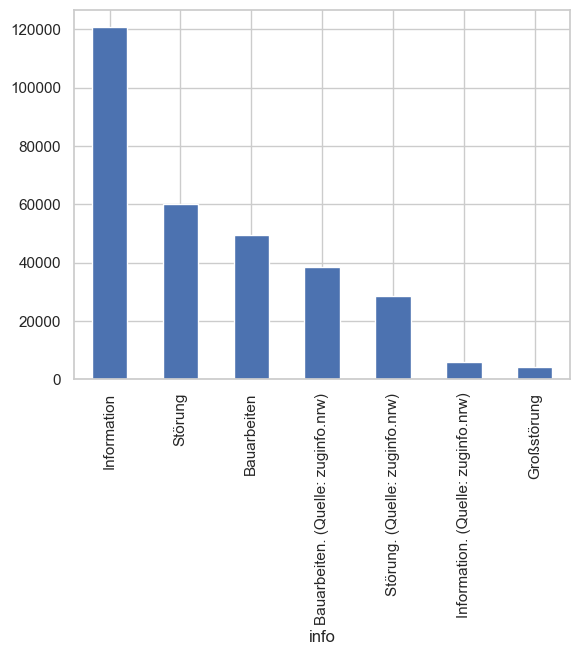

In [50]:
df["info"].value_counts().plot.bar()

# Temporal analysis

to be done: erste und letzte zeile rauswerfen, fehlende daten mit averages füllen, direkt vorgroupieren

In [8]:
df_temp_arr = df.dropna(subset=["arrival_plan"])
df_temp_dep = df.dropna(subset=["departure_plan"])

In [9]:
date_format = "%Y-%m-%d %H:%M:%S"
df_temp_arr = df.dropna(subset=["arrival_plan"]).copy()
df_temp_arr.loc[:, "arrival_plan_hour"] = df_temp_arr["arrival_plan"].dt.hour
df_temp_arr.loc[:, "arrival_plan_datetime"] = (
    df_temp_arr["arrival_plan_date"].astype(str) + ' ' +
    df_temp_arr["arrival_plan_hour"].astype(str) + ':00:00'
)
df_temp_arr.loc[:, "arrival_plan_datetime"] = pd.to_datetime(df_temp_arr["arrival_plan_datetime"], format=date_format)

In [10]:
df_temp_dep = df.dropna(subset=["departure_plan"]).copy()
df_temp_dep.loc[:, "departure_plan_hour"] = df_temp_dep["departure_plan"].dt.hour
df_temp_dep.loc[:, "departure_plan_datetime"] = (
    df_temp_dep["departure_plan_date"].astype(str) + ' ' +
    df_temp_dep["departure_plan_hour"].astype(str) + ':00:00'
)
df_temp_dep.loc[:, "departure_plan_datetime"] = pd.to_datetime(df_temp_dep["departure_plan_datetime"], format=date_format)

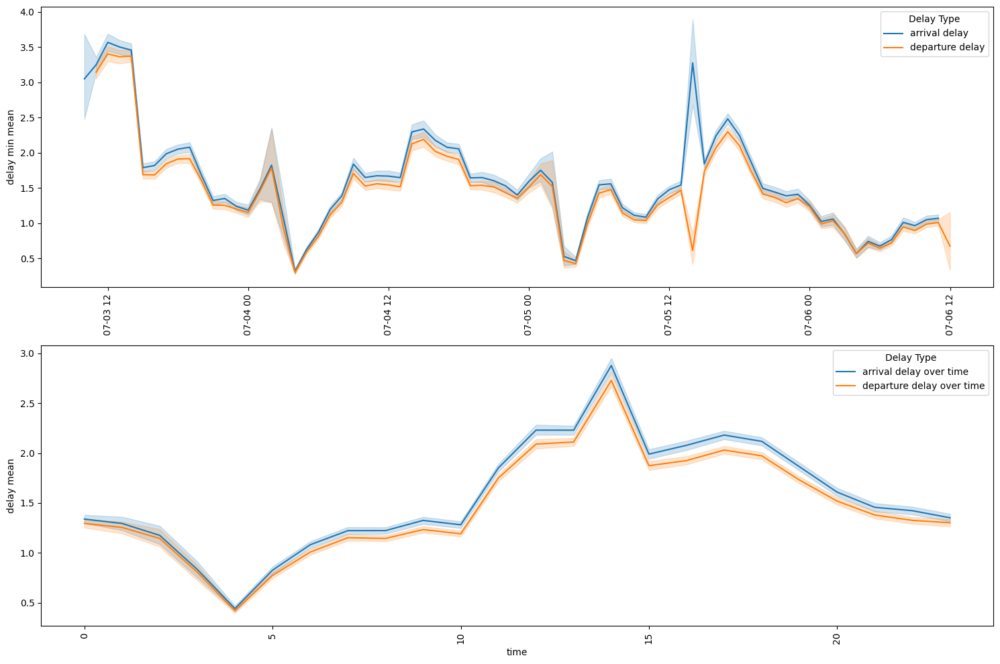

In [11]:
fig, axes = plt.subplots(nrows=2, figsize=(15, 10))

# First plot: arrival and departure delays over datetime
sns.lineplot(df_temp_arr, x="arrival_plan_datetime", y="arrival_delay_m", label="arrival delay", ax=axes[0])
sns.lineplot(df_temp_dep, x="departure_plan_datetime", y="departure_delay_m", label="departure delay", ax=axes[0])
axes[0].set_xlabel("")
axes[0].set_ylabel("delay min mean")
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title="Delay Type")

# Second plot: arrival and departure delays over time of day
sns.lineplot(df_temp_arr, x="arrival_plan_hour", y="arrival_delay_m", label="arrival delay over time", ax=axes[1])
sns.lineplot(df_temp_dep, x="departure_plan_hour", y="departure_delay_m", label="departure delay over time", ax=axes[1])
axes[1].set_xlabel("time")
axes[1].set_ylabel("delay mean")
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title="Delay Type")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

the data indicates a seasonality with peaks around late afternoon around 16:00.<br>
the gap on the 24th comes from a gap in the data collection around that time

as arrival and departure follow a similar temporal pattern, we will only discuss arrival going further

In [12]:
df_temp_cat = df_temp_arr.groupby(["arrival_plan_datetime", "category"], as_index=False).arrival_delay_m.mean()
df_temp_cat2 = df_temp_arr.groupby(["arrival_plan_hour", "category"], as_index=False).arrival_delay_m.mean()

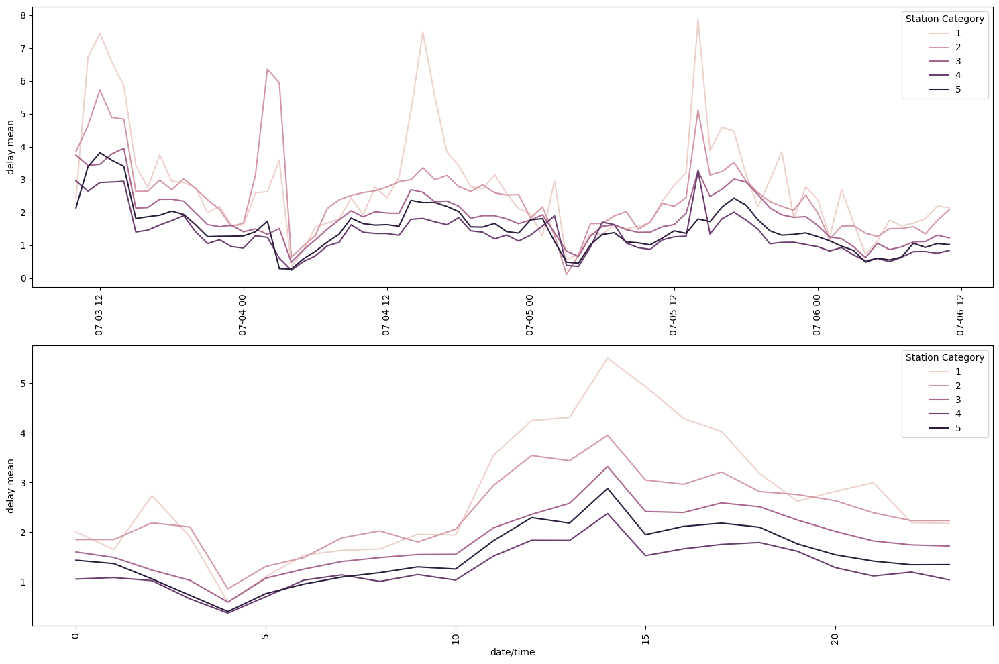

In [13]:
# Create a figure with two subplots arranged vertically
fig, axes = plt.subplots(nrows=2, figsize=(15, 10))

# First plot: arrival delays over datetime with category hue
sns.lineplot(df_temp_cat, x="arrival_plan_datetime", y="arrival_delay_m", hue="category", ax=axes[0])
axes[0].set_xlabel("")
axes[0].set_ylabel("delay mean")
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title="Station Category")

# Second plot: arrival delays over time of day with category hue
sns.lineplot(df_temp_cat2, x="arrival_plan_hour", y="arrival_delay_m", hue="category", ax=axes[1])
axes[1].set_xlabel("date/time")
axes[1].set_ylabel("delay mean")
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title="Station Category")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

All station types follow a similar pattern,  while the mean of the delay increases the lower the category (more delay on main junctions)

In [14]:
heatmap_df2 = df_temp_arr.groupby(["name","arrival_plan_datetime"], as_index=False ).mean(numeric_only=True)

In [15]:
fig = px.density_mapbox(heatmap_df2,
                        lat='lat', lon='long', z='arrival_delay_m',
                        hover_name='name',
                        radius=10,
                        center=dict(lat=0, lon=180), zoom=10,
                        range_color=[0, heatmap_df2.arrival_delay_m.max()],
                        animation_frame="arrival_plan_datetime"
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 51.1657, "lon": 10.4515},  # Centered on Germany
    mapbox_zoom=5,
    width=700,
    height=700
)

# Geographical analysis
## Heatmap

In [16]:
heatmap_df = df.groupby("name", as_index=False ).mean(numeric_only=True)

In [17]:
fig = px.density_mapbox(heatmap_df,
                        lat='lat', lon='long', z='arrival_delay_m',
                        hover_name='name',
                        radius=10,
                        center=dict(lat=0, lon=180), zoom=10,
                        range_color=[0, heatmap_df.arrival_delay_m.max()]
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 51.1657, "lon": 10.4515},  # Centered on Germany
    mapbox_zoom=5,
    width=700,
    height=800
)


In [18]:
fig = px.density_mapbox(heatmap_df,
                        lat='lat', lon='long', z='departure_delay_m',
                        hover_name='name',
                        radius=10,
                        center=dict(lat=0, lon=180), zoom=10,
                        range_color=[0, heatmap_df.arrival_delay_m.max()]
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 51.1657, "lon": 10.4515},  # Centered on Germany
    mapbox_zoom=5,
    width=700,
    height=800
)
fig.show()

# Creating columns for arrival and departure analysis

In [19]:
df_state_count_delay = df[df["arrival_delay_check"] == "delay"].groupby("state", as_index=False).count()
df_state_count_delay.head()

,state,ID,train,path,eva_nr,category,name,city,zip,long,...,departure_change,arrival_delay_m,departure_delay_m,info,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,Baden-Württemberg,10873,10873,10873,10873,10873,10873,10873,10873,10873,...,10835,10873,10873,6966,10873,10873,10873,10873,10873,10873
1,Bayern,11555,11555,11555,11555,11555,11555,11555,11555,11555,...,11547,11555,11555,4979,11555,11555,11555,11555,11555,11555
2,Berlin,3382,3382,3382,3382,3382,3382,3382,3382,3382,...,3381,3382,3382,1293,3382,3382,3382,3382,3382,3382
3,Brandenburg,1051,1051,1051,1051,1051,1051,1051,1051,1051,...,1049,1051,1051,290,1051,1051,1051,1051,1051,1051
4,Bremen,102,102,102,102,102,102,102,102,102,...,102,102,102,54,102,102,102,102,102,102


In [20]:
df_state_count_delay2 = df[df["departure_delay_check"] == "delay"].groupby("state", as_index=False).count()
df_state_count_delay.head()

,state,ID,train,path,eva_nr,category,name,city,zip,long,...,departure_change,arrival_delay_m,departure_delay_m,info,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,Baden-Württemberg,10873,10873,10873,10873,10873,10873,10873,10873,10873,...,10835,10873,10873,6966,10873,10873,10873,10873,10873,10873
1,Bayern,11555,11555,11555,11555,11555,11555,11555,11555,11555,...,11547,11555,11555,4979,11555,11555,11555,11555,11555,11555
2,Berlin,3382,3382,3382,3382,3382,3382,3382,3382,3382,...,3381,3382,3382,1293,3382,3382,3382,3382,3382,3382
3,Brandenburg,1051,1051,1051,1051,1051,1051,1051,1051,1051,...,1049,1051,1051,290,1051,1051,1051,1051,1051,1051
4,Bremen,102,102,102,102,102,102,102,102,102,...,102,102,102,54,102,102,102,102,102,102


In [21]:
df_state_count = df.groupby("state", as_index=False).count()
df_state_count.head()

,state,ID,train,path,eva_nr,category,name,city,zip,long,...,departure_change,arrival_delay_m,departure_delay_m,info,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,Baden-Württemberg,113616,113616,99254,113616,113616,113616,113616,113616,113616,...,104745,113616,113616,54324,113616,113616,99254,99254,113616,113616
1,Bayern,144422,144422,130130,144422,144422,144422,144422,144422,144422,...,136362,144422,144422,56364,144422,144422,130130,130130,144422,144422
2,Berlin,145395,145395,140412,145395,145395,145395,145395,145395,145395,...,114956,145395,145395,24268,145395,145395,140412,140412,145395,145395
3,Brandenburg,25410,25410,20893,25410,25410,25410,25410,25410,25410,...,21016,25410,25410,4656,25410,25410,20893,20893,25410,25410
4,Bremen,4411,4411,3702,4411,4411,4411,4411,4411,4411,...,2067,4411,4411,1363,4411,4411,3702,3702,4411,4411


In [22]:
df_state_sum = df.groupby("state", as_index=False).sum("arrival_delay_m")
df_state_sum.head()


,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m
0,Baden-Württemberg,909292549073,430373,8388876366,1.017009e+06,5.537722e+06,202837,217378
1,Bayern,1155838735994,549345,12303787979,1.639861e+06,7.005480e+06,273257,279269
2,Berlin,1175238846331,573289,1726804172,1.947634e+06,7.633885e+06,89869,92757
3,Brandenburg,204188434750,105470,351831084,3.413994e+05,1.331207e+06,23289,26002
4,Bremen,35291982427,18311,125079645,3.850713e+04,2.345778e+05,2127,2263


## Merging Dataframes

In [23]:
#merging
df_state = pd.merge(df_state_sum, df_state_count[["state","arrival_plan","departure_plan"]], how='left', on="state", suffixes=('', '_count'))
df_state = pd.merge(df_state, df_state_count_delay[["state","arrival_delay_check"]], how='left', on="state", suffixes=('', '_count'))
df_state = pd.merge(df_state, df_state_count_delay2[["state","departure_delay_check"]], how='left', on="state", suffixes=('', '_count'))

In [24]:
df_state = df_state[[
    'state', 
    #'eva_nr', 'category', 'zip', 'long', 'lat', 
    'arrival_delay_m',
    'departure_delay_m', 'arrival_plan', 'departure_plan',
    'arrival_delay_check', 'departure_delay_check',
    ]]

In [25]:
df_state.head()

,state,arrival_delay_m,departure_delay_m,arrival_plan,departure_plan,arrival_delay_check,departure_delay_check
0,Baden-Württemberg,202837,217378,99254,113616,10873,11434
1,Bayern,273257,279269,130130,144422,11555,11361
2,Berlin,89869,92757,140412,145395,3382,3437
3,Brandenburg,23289,26002,20893,25410,1051,1095
4,Bremen,2127,2263,3702,4411,102,95


## Calculating new rows

In [26]:
df_state["arrival_plan%"] = (df_state["arrival_plan"] / df_state["arrival_plan"].sum()) * 100
df_state["arr_delay_amount_%"] = (df_state["arrival_delay_m"] / df_state["arrival_delay_m"].sum()) * 100
df_state["delay/arrival"] = (df_state["arrival_delay_m"] / df_state["arrival_plan"])
df_state["delay_cnt/arrival"] = (df_state["arrival_delay_check"] / df_state["arrival_plan"]) *100

In [27]:
df_state["departure_plan%"] = (df_state["departure_plan"] / df_state["departure_plan"].sum()) * 100
df_state["dep_delay_amount_%"] = (df_state["departure_delay_m"] / df_state["departure_delay_m"].sum()) * 100
df_state["delay/departure"] = (df_state["departure_delay_m"] / df_state["departure_plan"])
df_state["delay_cnt/departure"] = (df_state["departure_delay_check"] / df_state["departure_plan"]) *100

In [28]:
df_state.head()

,state,arrival_delay_m,departure_delay_m,arrival_plan,departure_plan,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
0,Baden-Württemberg,202837,217378,99254,113616,10873,11434,12.225642,14.902979,2.043615,10.954722,12.567961,15.277518,1.913269,10.063723
1,Bayern,273257,279269,130130,144422,11555,11361,16.028803,20.076926,2.099877,8.879582,15.975655,19.627272,1.933701,7.866530
2,Berlin,89869,92757,140412,145395,3382,3437,17.295292,6.602917,0.640038,2.408626,16.083286,6.519044,0.637966,2.363905
3,Brandenburg,23289,26002,20893,25410,1051,1095,2.573502,1.711105,1.114680,5.030393,2.810800,1.827444,1.023298,4.309327
4,Bremen,2127,2263,3702,4411,102,95,0.455995,0.156276,0.574554,2.755267,0.487935,0.159046,0.513036,2.153707


# Side by Side comparison

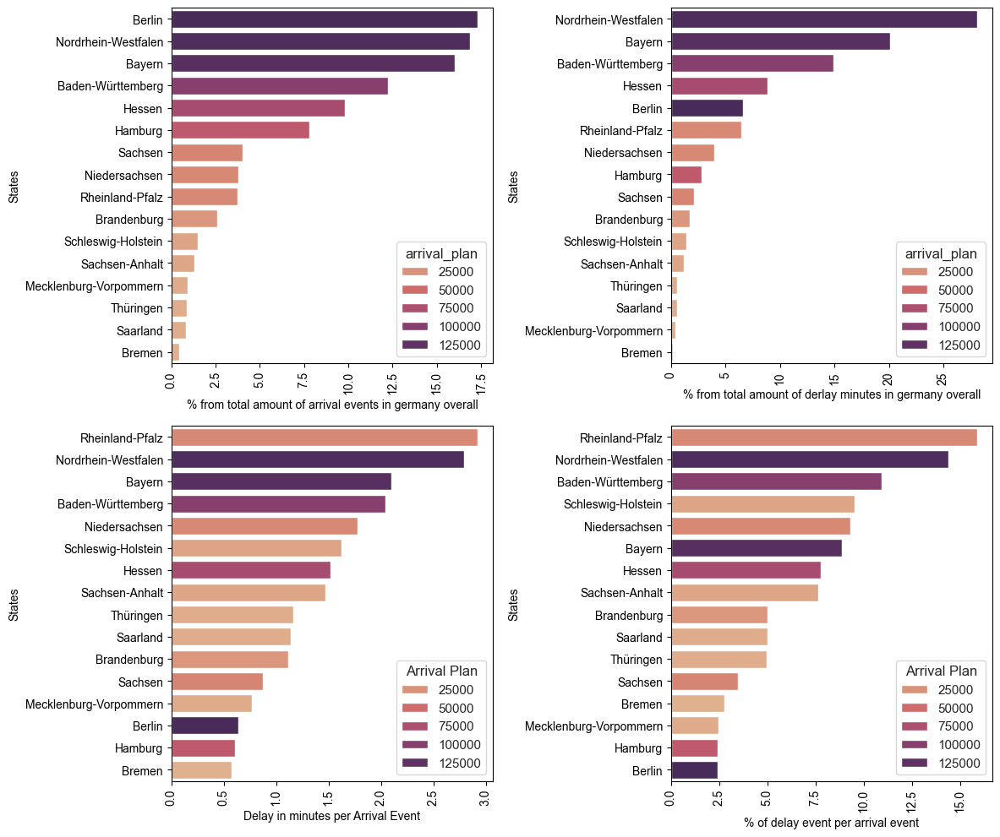

In [29]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_state.sort_values(by="arrival_plan%", ascending=False), x="arrival_plan%", y="state", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in germany overall")
axes[0,0].set_ylabel("States")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_state.sort_values(by="arr_delay_amount_%", ascending=False), x="arr_delay_amount_%", y="state", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in germany overall")
axes[0,1].set_ylabel("States")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_state.sort_values(by="delay/arrival", ascending=False), y="state", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("States")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_state.sort_values(by="delay_cnt/arrival", ascending=False), y="state", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("States")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

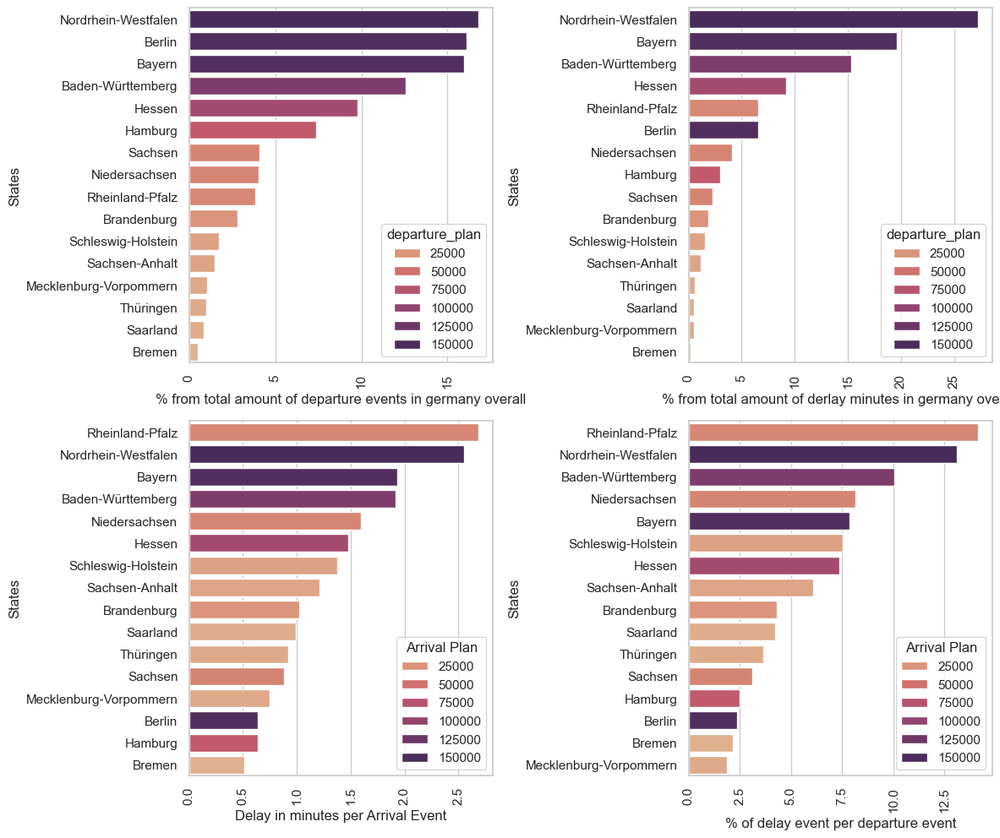

In [30]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_state.sort_values(by="departure_plan%", ascending=False), x="departure_plan%", y="state", 
            palette="flare", hue="departure_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of departure events in germany overall")
axes[0,0].set_ylabel("States")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="departure_plan")

# Second bar plot
sns.barplot(data=df_state.sort_values(by="dep_delay_amount_%", ascending=False), x="dep_delay_amount_%", y="state", 
            palette="flare", hue="departure_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in germany overall")
axes[0,1].set_ylabel("States")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="departure_plan")

# Third bar plot
sns.barplot(data=df_state.sort_values(by="delay/departure", ascending=False), y="state", x="delay/departure", 
            palette="flare", orient="h", hue="departure_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("States")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_state.sort_values(by="delay_cnt/departure", ascending=False), y="state", x="delay_cnt/departure", 
            palette="flare", orient="h", hue="departure_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per departure event")
axes[1,1].set_ylabel("States")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

NRW; BW, Bayern and Hessen have the highest ratio of delay time to arrival events and are therefore the prime suspects for in depth analysis.
<br>While Rheinland-Pfalz and Niedersachsen also have a high ratio, they are in the lower parts for total amounts of arrival events and therefore not as important to prioritize.

# Details for the most important States
### NRW, BW, Bayern, Hessen

In [31]:
df_city_sum = df.groupby(["city", "state"], as_index=False).sum("arrival_delay_m")
df_city_count = df.groupby(["city", "state"], as_index=False).count()
df_city_count_delay2 = df[df["departure_delay_check"] == "delay"].groupby(["city", "state"], as_index=False).count()
df_city_count_delay = df[df["arrival_delay_check"] == "delay"].groupby(["city", "state"], as_index=False).count()

In [32]:
df_city = pd.merge(df_city_sum, df_city_count[["city","arrival_plan","departure_plan"]], how='left', on="city", suffixes=('', '_count'))
df_city = pd.merge(df_city, df_city_count_delay[["city","arrival_delay_check"]], how='left', on="city", suffixes=('', '_count'))
df_city = pd.merge(df_city, df_city_count_delay2[["city","departure_delay_check"]], how='left', on="city", suffixes=('', '_count'))

In [33]:
df_city["arrival_plan%"] = (df_city["arrival_plan"] / df_city["arrival_plan"].sum()) * 100
df_city["arr_delay_amount_%"] = (df_city["arrival_delay_m"] / df_city["arrival_delay_m"].sum()) * 100
df_city["delay/arrival"] = (df_city["arrival_delay_m"] / df_city["arrival_plan"])
df_city["delay_cnt/arrival"] = (df_city["arrival_delay_check"] / df_city["arrival_plan"]) *100

df_city["departure_plan%"] = (df_city["departure_plan"] / df_city["departure_plan"].sum()) * 100
df_city["dep_delay_amount_%"] = (df_city["departure_delay_m"] / df_city["departure_delay_m"].sum()) * 100
df_city["delay/departure"] = (df_city["departure_delay_m"] / df_city["departure_plan"])
df_city["delay_cnt/departure"] = (df_city["departure_delay_check"] / df_city["departure_plan"]) *100

In [34]:
df_city

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
0,Dresden,Sachsen,969630475,605,129107,1658.686271,6177.780114,162,158,121,...,11.0,11.0,0.014810,0.011804,1.338843,9.090909,0.013273,0.011000,1.305785,9.090909
1,Freinsheim,Rheinland-Pfalz,2272106216,1136,19099284,2330.274528,14058.424012,184,160,200,...,2.0,1.0,0.024479,0.013407,0.920000,1.000000,0.031154,0.011139,0.563380,0.352113
2,Nürnberg,Bayern,2560636480,1600,28952000,3575.702400,15812.268800,579,675,320,...,19.0,17.0,0.039167,0.042188,1.809375,5.937500,0.035103,0.046992,2.109375,5.312500
3,Pforzheim,Baden-Württemberg,1864452486,1165,17517173,2037.298876,11395.994118,309,315,233,...,13.0,13.0,0.028518,0.022515,1.326180,5.579399,0.025559,0.021930,1.351931,5.579399
4,Remchingen,Baden-Württemberg,1913539160,1195,17971844,2048.807185,11699.973018,312,364,190,...,20.0,25.0,0.023255,0.022733,1.642105,10.526316,0.026217,0.025341,1.523013,10.460251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1302,Züssow,Mecklenburg-Vorpommern,1385798508,865,3026635,2343.837043,9337.481067,219,283,115,...,13.0,16.0,0.014075,0.015957,1.904348,11.304348,0.018977,0.019702,1.635838,9.248555
1303,Öhringen,Baden-Württemberg,2721571820,1700,25368420,3230.919700,16729.092760,609,563,335,...,21.0,17.0,0.041002,0.044374,1.817910,6.268657,0.037296,0.039195,1.655882,5.000000
1304,Ötigheim,Baden-Württemberg,1737006012,868,16593990,1788.206294,10608.810142,245,237,217,...,11.0,10.0,0.026560,0.017851,1.129032,5.069124,0.023804,0.016499,1.092166,4.608295
1305,Übach-Palenberg,Nordrhein-Westfalen,2794071315,1745,18333319,2127.945485,17772.593264,1079,1019,349,...,52.0,43.0,0.042716,0.078619,3.091691,14.899713,0.038284,0.070941,2.919771,12.320917


In [35]:
# Creating df_city for the single states
df_nrw = df_city[df_city["state"] == "Nordrhein-Westfalen"]
df_bw = df_city[df_city["state"] == "Baden-Württemberg"]
df_bay = df_city[df_city["state"] == "Bayern"]
df_hes = df_city[df_city["state"] == "Hessen"]

## 1) NRW

In [36]:
#NRW
df_nrw.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
6,Aachen,Nordrhein-Westfalen,18661594152,9326,121211852,14166.528313,118198.982666,3297,3841,1877,...,125.0,137.0,0.229736,0.240229,1.756526,6.659563,0.255371,0.267402,1.649914,5.884880
10,Ahaus,Nordrhein-Westfalen,800043700,500,4868300,701.645300,5208.168100,331,297,100,...,21.0,18.0,0.012240,0.024118,3.310000,21.000000,0.010970,0.020676,2.970000,18.000000
11,Ahlen,Nordrhein-Westfalen,1760097020,880,13029940,1737.007360,11387.433640,628,625,220,...,45.0,43.0,0.026927,0.045758,2.854545,20.454545,0.024133,0.043511,2.840909,19.545455
21,Altena,Nordrhein-Westfalen,1656106191,828,12163734,1587.443256,10619.510067,359,356,207,...,24.0,22.0,0.025336,0.026158,1.734300,11.594203,0.022707,0.024784,1.719807,10.628019
22,Altenbeken,Nordrhein-Westfalen,3928001964,1473,16293344,4391.169629,25417.318603,541,515,488,...,24.0,24.0,0.059729,0.039419,1.108607,4.918033,0.053860,0.035853,1.048880,4.887984


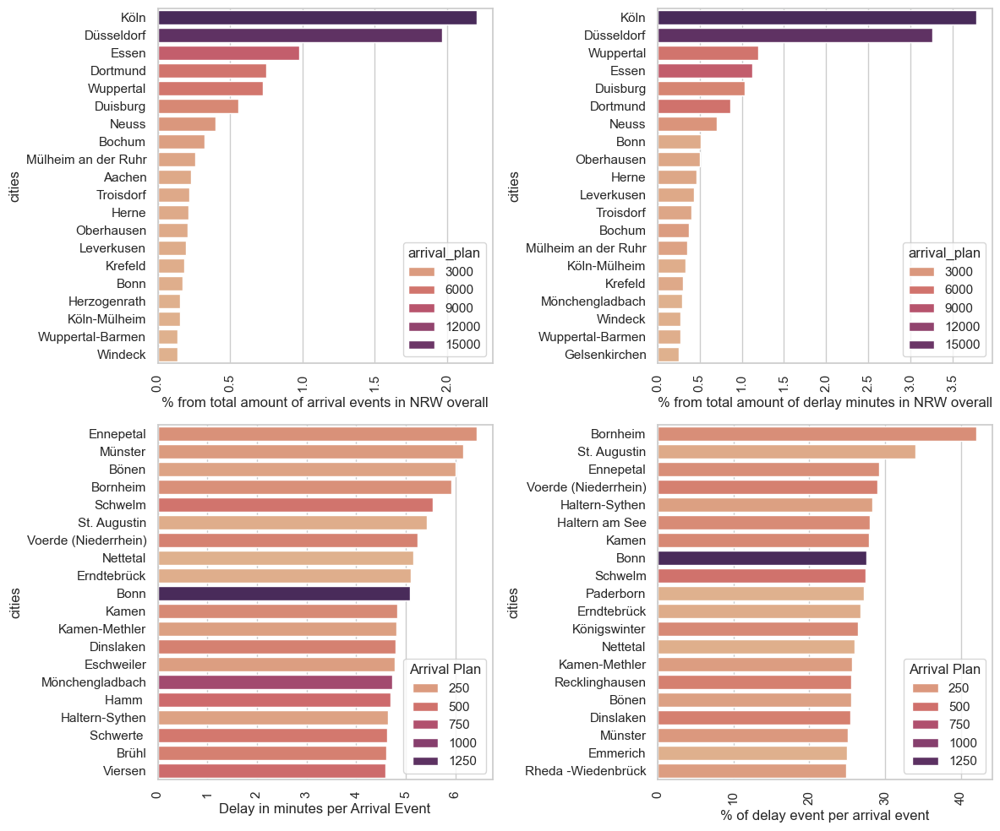

In [37]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_nrw.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in NRW overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_nrw.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in NRW overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_nrw.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_nrw.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

## 2) Baden-Württemberg

In [38]:
df_bw.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
3,Pforzheim,Baden-Württemberg,1864452486,1165,17517173,2037.298876,11395.994118,309,315,233,...,13.0,13.0,0.028518,0.022515,1.326180,5.579399,0.025559,0.021930,1.351931,5.579399
4,Remchingen,Baden-Württemberg,1913539160,1195,17971844,2048.807185,11699.973018,312,364,190,...,20.0,25.0,0.023255,0.022733,1.642105,10.526316,0.026217,0.025341,1.523013,10.460251
5,Stutensee,Baden-Württemberg,1496188683,935,14267539,1582.904323,9175.440736,179,202,187,...,10.0,9.0,0.022888,0.013042,0.957219,5.347594,0.020513,0.014063,1.080214,4.812834
7,Aalen,Baden-Württemberg,2840000710,1065,26067650,3584.176205,17338.559615,225,301,112,...,12.0,19.0,0.013708,0.016394,2.008929,10.714286,0.038942,0.020955,0.847887,5.352113
8,Achern,Baden-Württemberg,2176112064,1088,21176560,2193.768128,13228.445280,250,266,178,...,8.0,8.0,0.021786,0.018216,1.404494,4.494382,0.029837,0.018518,0.977941,2.941176


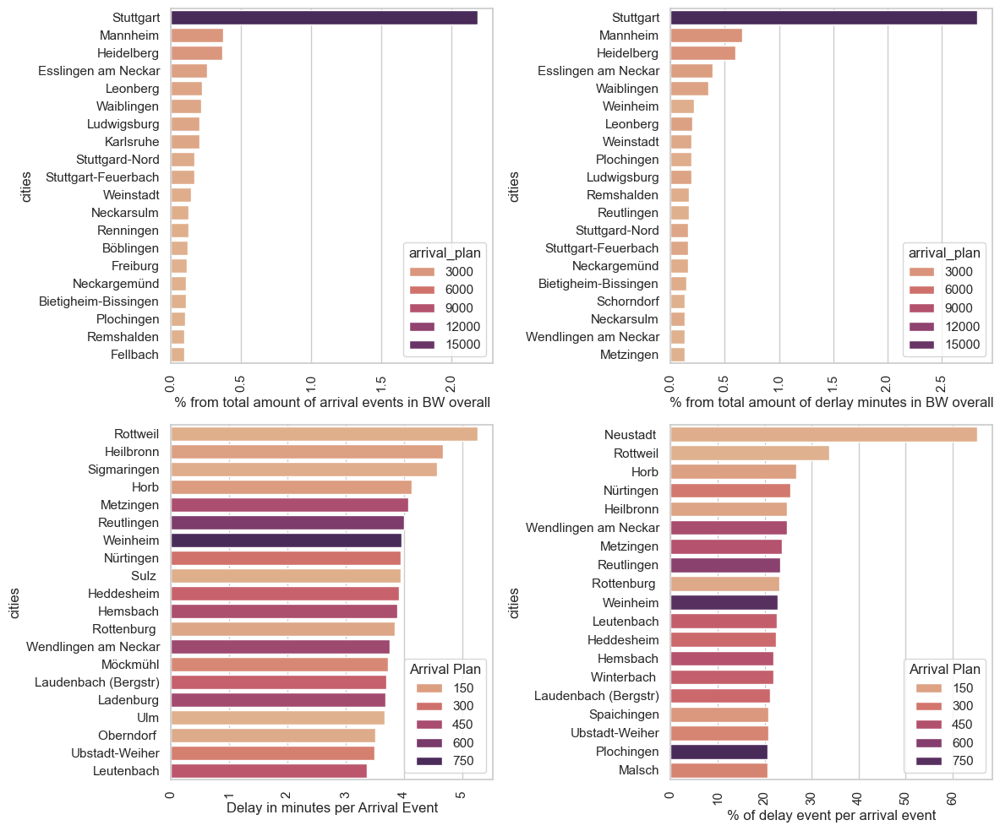

In [39]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_bw.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in BW overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_bw.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in BW overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_bw.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_bw.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

## 3) Bayern

In [40]:
df_bay.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
2,Nürnberg,Bayern,2560636480,1600,28952000,3575.702400,15812.268800,579,675,320,...,19.0,17.0,0.039167,0.042188,1.809375,5.937500,0.035103,0.046992,2.109375,5.312500
13,Aichach,Bayern,1296073224,810,14021262,1801.880802,7850.700954,108,112,117,...,4.0,4.0,0.014320,0.007869,0.923077,3.418803,0.017771,0.007797,0.691358,2.469136
25,Althegnenberg,Bayern,1328090470,830,13658148,1836.458498,8007.238084,62,63,166,...,4.0,4.0,0.020318,0.004518,0.373494,2.409639,0.018209,0.004386,0.379518,2.409639
27,Amberg,Bayern,1176083202,735,13556928,1743.846594,7268.799552,152,187,145,...,9.0,8.0,0.017747,0.011075,1.048276,6.206897,0.016125,0.013019,1.272109,5.442177
28,Ampfing,Bayern,984070848,615,10398297,1526.543037,5935.235727,240,258,123,...,9.0,9.0,0.015055,0.017487,1.951220,7.317073,0.013493,0.017961,2.097561,7.317073


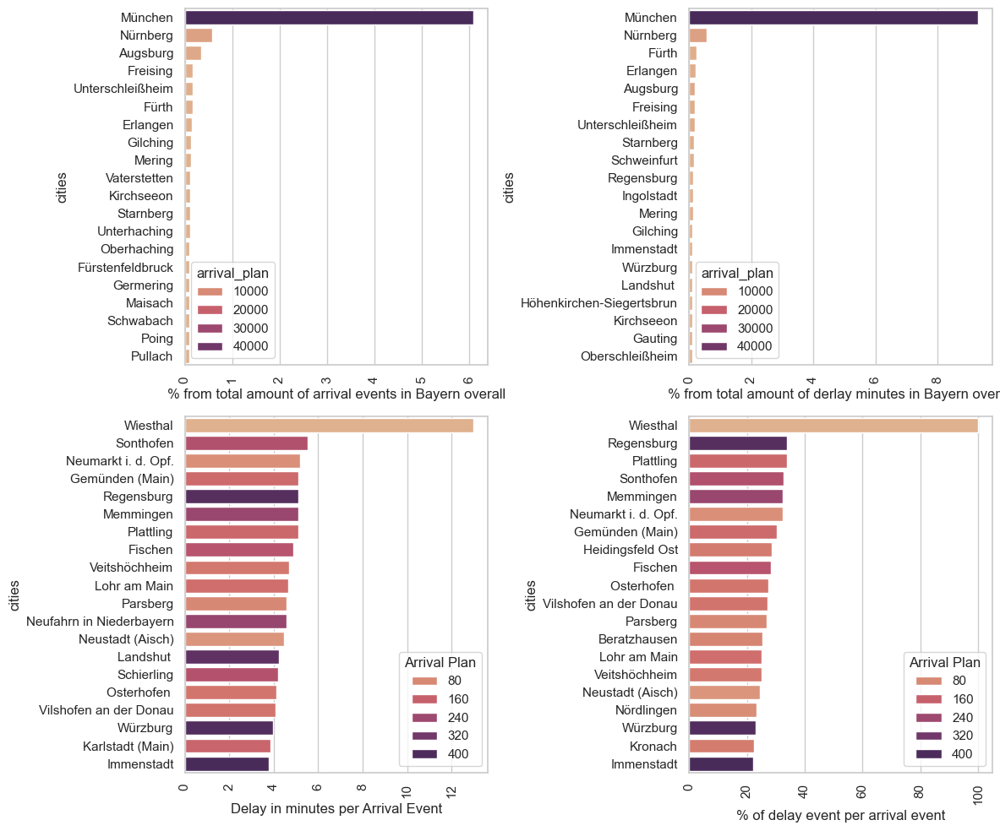

In [41]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_bay.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in Bayern overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_bay.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in Bayern overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_bay.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_bay.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

## 4) Hessen

In [42]:
df_hes.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
17,Alsbach-Hähnlein,Hessen,1728539568,1080,13967640,1859.039424,10743.699600,490,518,216,...,23.0,25.0,0.026437,0.035703,2.268519,10.648148,0.023694,0.036062,2.398148,11.574074
18,Alsfeld,Hessen,984043050,615,4465392,1139.508531,6242.368326,18,17,100,...,NaN,NaN,0.012240,0.001312,0.180000,NaN,0.013493,0.001184,0.138211,NaN
51,Babenhausen,Hessen,4256007980,2660,34490624,4765.220824,26577.636316,667,552,532,...,33.0,28.0,0.065114,0.048600,1.253759,6.203008,0.058358,0.038429,1.037594,5.263158
58,Bad Camberg,Hessen,1552256468,970,12710880,1601.476984,9757.508002,286,291,194,...,11.0,12.0,0.023745,0.020839,1.474227,5.670103,0.021281,0.020259,1.500000,6.185567
65,Bad Hersfeld,Hessen,1472003680,552,6670184,1787.777488,9360.012288,291,299,138,...,16.0,15.0,0.016891,0.021203,2.108696,11.594203,0.020184,0.020816,1.625000,8.152174


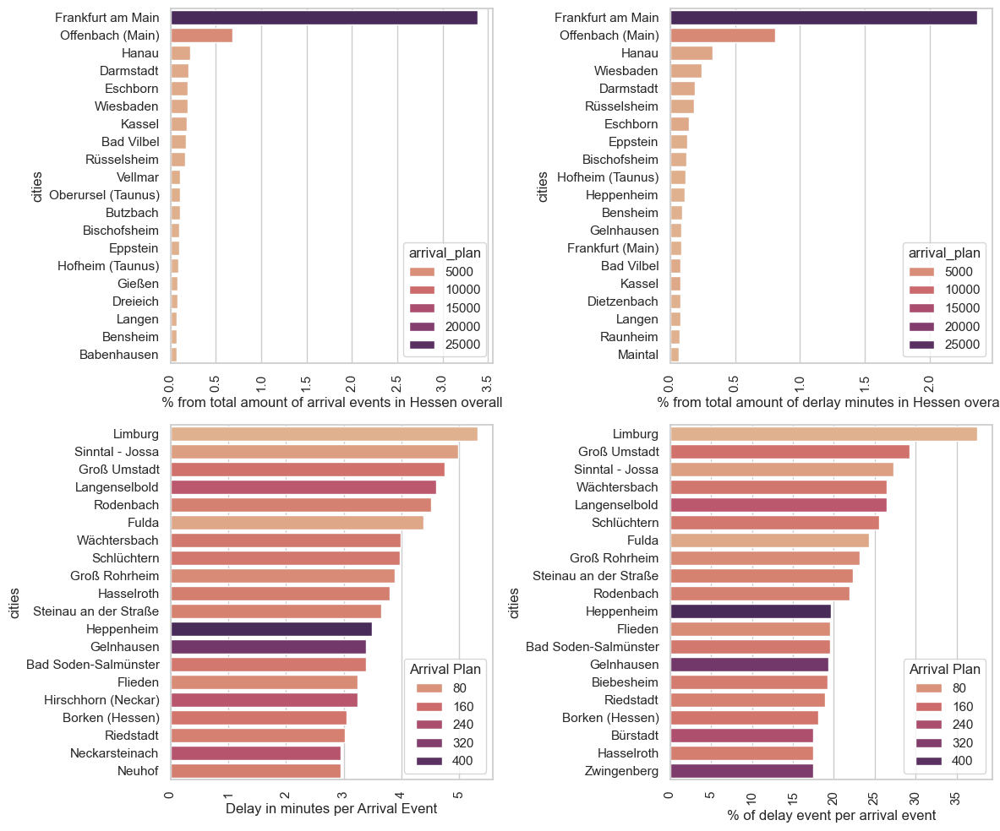

In [43]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_hes.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in Hessen overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_hes.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in Hessen overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_hes.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_hes.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()